# Install

In [1]:
!pip install razdel
!python -m spacy download ru_core_news_sm
!pip install evaluate rouge_score

# Import

In [ ]:
#база
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from tqdm.notebook import tqdm
%config InlineBackend.figure_format = 'retina'

#Обработка текстов
import razdel
from razdel import sentenize
from pymystem3 import Mystem
import spacy
import re
from wordcloud import WordCloud
from collections import Counter

#Расчёт метрик
import evaluate

# Gazeta

In [ ]:
path = '/content/drive/MyDrive/Курсовые/Transformers 2/'
path = '/content/drive/MyDrive/Курсовая/'
df = pd.read_excel(path + "Рефераты_моделей.xlsx")
df.head(2)

,text,summary,rubert_ext_sum,rut5_abs_sum,gpt_abs_sum,YandexGPT5_PRO_RC,GigaChat_2_Lite,meta-llama/llama-4-scout-17b-16e-instruct,deepseek-r1-distill-llama-70b,ministral-8b-latest,mistral-large-latest,YandexGPT5_Lite_RC
0,Американские вооруженные силы должны быть гото...,Экс-президент США продолжает критиковать админ...,Американские вооруженные силы должны быть гото...,"Бывший глава Белого дома Дональд Трамп заявил,...","Бывший президент США Дональд Трамп заявил, что...",NaN,NaN,"Дональд Трамп заявил, что американские вооруже...","Дональд Трамп заявил, что США должны быть гото...","Экс-президент США Дональд Трамп заявил, что ам...","Бывший президент США Дональд Трамп заявил, что...",NaN
1,"Международный коллектив ученых из Гарварда , П...",Международный коллектив под руководством гарва...,"Международный коллектив ученых из Гарварда , П...","Международный коллектив ученых из Гарварда, Пр...",Ученые из Гарварда и Принстона объявили о нача...,Международный коллектив учёных во главе с гарв...,Гарвардские ученые начали проект Galileo для п...,"Группа ученых из известных университетов, возг...",Международная команда ученых под руководством ...,"Международный коллектив ученых, включая Ави Лё...",Международная группа ученых под руководством А...,Международный коллектив учёных начал поиск док...


In [ ]:
# --- Предобработка текста ---
def simple_preprocess(text):
    text = text.lower()
    text = re.sub(r'\d+', '', text)         # Удаляем цифры
    text = re.sub(r'[^\w\s]', '', text)     # Удаляем знаки препинания
    return text

def preprocess(texts, lang='ru'):
    texts = [simple_preprocess(text) for text in tqdm(texts, desc='Предобработка')]

    nlp = spacy.load("ru_core_news_sm")#pip install - обязательно
    stop_words = nlp.Defaults.stop_words | {'изза'}

    texts = [[word for word in text.split() if word not in stop_words] for text in tqdm(texts, desc='Удаление стоп-слов')]

    mystem = Mystem()
    texts = [''.join(mystem.lemmatize(' '.join(text))) for text in tqdm(texts, desc='Лемматизация')]

    return texts

# Анализ исходных текстов и рефератов

In [ ]:
texts = df.text.values
processed_texts = preprocess(texts)

In [ ]:
summary_texts = df.summary.values
processed_summary_texts = preprocess(summary_texts)

## Кол-во слов/предложений

In [ ]:
def word_sent_distribution(texts, title='', summary = True):
    word_counts = [len(text.split()) for text in texts]
    sentence_counts = [len(list(sentenize(text))) for text in texts]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 7))

    # --- График 1: слова ---
    bin_min, bin_max = 10, 110
    bins = np.linspace(bin_min, bin_max, 30 + 1)
    sns.histplot(word_counts, bins= bins if summary else 20, kde=True, ax=axes[0], color='skyblue')
    axes[0].set_title('Распределение Слов')
    axes[0].set_xlabel('Количество слов')
    axes[0].set_ylabel('Количество текстов')
    if summary : axes[0].set_xlim(bin_min, bin_max)

    # --- График 2: предложения ---
    bin_min, bin_max = 1, 8
    bins = np.linspace(bin_min, bin_max, 15 + 1)
    sns.histplot(sentence_counts, bins= bins if summary else 20, kde=False, ax=axes[1], color='salmon')
    axes[1].set_title('Распределение Предложений')
    axes[1].set_xlabel('Количество предложений')
    axes[1].set_ylabel('Количество текстов')
    if summary : axes[1].set_xlim(bin_min, bin_max)

    # Устанавливаем тики на оси X только на натуральные числа
    if summary : axes[1].set_xticks(np.arange(1, 8 + 1))

    # --- Общий заголовок ---
    fig.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


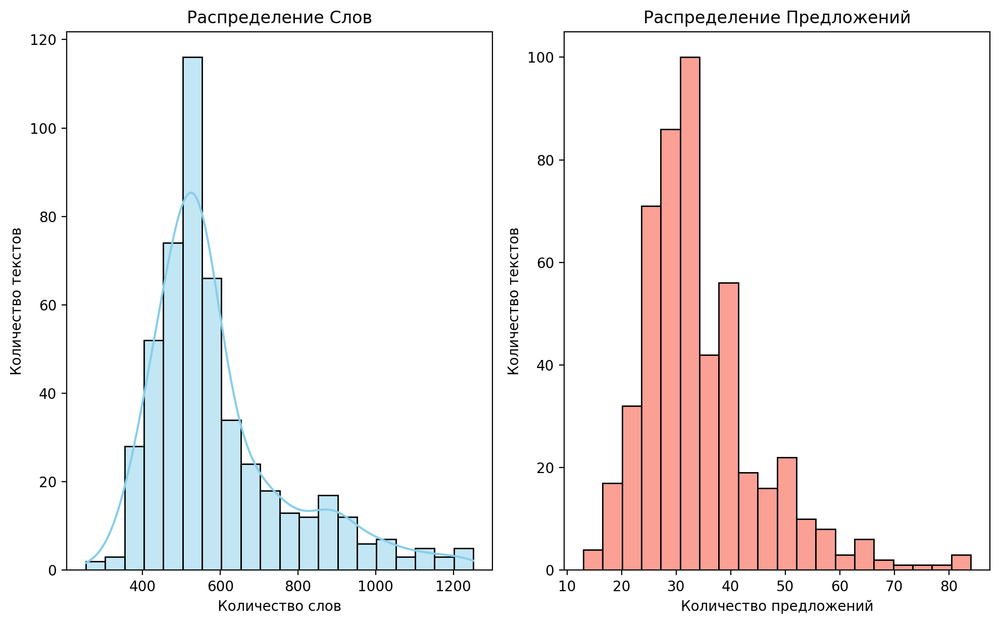

In [ ]:
word_sent_distribution(texts, summary = False)

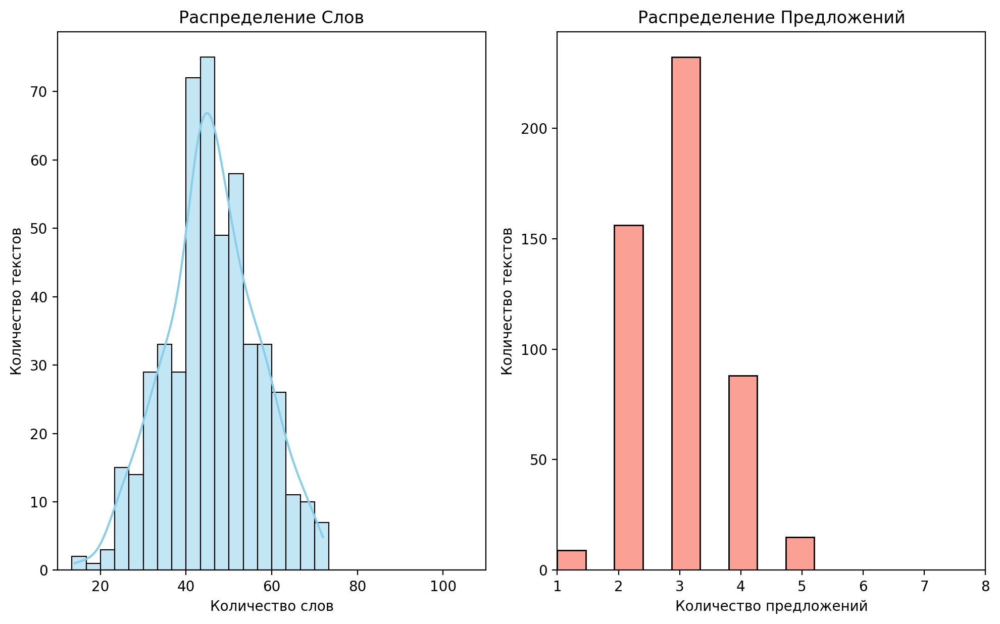

In [ ]:
word_sent_distribution(summary_texts)

## Облако слов

In [ ]:
def plot_single_wordcloud(processed_texts, ax, title='Облако Лемм'):
    all_text = ' '.join(processed_texts)
    tokens = [word for word in all_text.split() if len(word) > 1]
    word_freq = Counter(tokens)
    wordcloud = WordCloud(width=600, height=500, background_color='black',
                          max_font_size=110).generate_from_frequencies(word_freq)#max расмер текста

    ax.imshow(wordcloud, interpolation='lanczos')
    ax.axis('off')
    ax.set_title(title)

def plot_multiple_wordclouds(all_texts, n_cols, n_rows, figsize=(10, 4), titles=[]):
    # Применяем темный стиль только в данном контексте
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        # Приведём axes к 1D для удобства обхода
        axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

        total_plots = n_cols * n_rows
        num_texts = len(all_texts)
        # Если облаков меньше чем subplot-ов, оставшиеся оси отключим
        for idx in range(total_plots):
            if idx < num_texts:
                plot_single_wordcloud(all_texts[idx], axes[idx], title=titles[idx])
            else:
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()


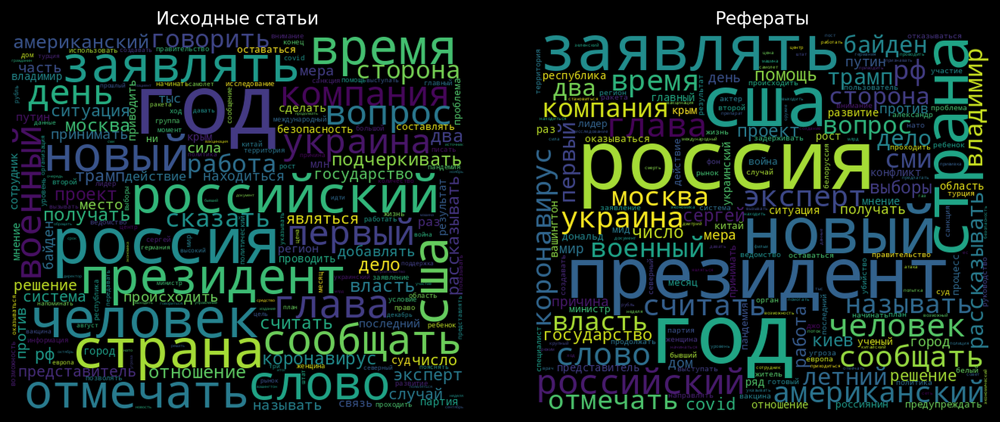

In [ ]:
plot_multiple_wordclouds([processed_texts, processed_summary_texts],n_cols = 2, n_rows = 1, titles = ['Исходные статьи', "Рефераты"])

## Зависимость слов/предложений

In [ ]:
def plot_summary_vs_original_stats(texts, summary_texts):
    word_counts_texts = [len(text.split()) for text in texts]
    word_counts_summaries = [len(text.split()) for text in summary_texts]

    sentence_counts_texts = [len(list(sentenize(text))) for text in texts]
    sentence_counts_summaries = [len(list(sentenize(text))) for text in summary_texts]

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

    # --- Слова ---
    sns.scatterplot(x=word_counts_texts, y=word_counts_summaries, ax=axes[0], color='steelblue')
    axes[0].set_title('Слова: Реферат vs Исходный текст')
    axes[0].set_xlabel('Количество слов в оригинале')
    axes[0].set_ylabel('Количество слов в реферате')
    axes[0].grid(True)

    # --- Предложения ---
    sns.scatterplot(x=sentence_counts_texts, y=sentence_counts_summaries, ax=axes[1], color='indianred')
    axes[1].set_title('Предложения: Реферат vs Исходный текст')
    axes[1].set_xlabel('Количество предложений в оригинале')
    axes[1].set_ylabel('Количество предложений в реферате')
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


In [ ]:
def plot_words_summary_vs_original_stats(texts, summary_texts):
    # Вычисляем количество слов в исходных текстах и рефератах
    word_counts_texts = [len(text.split()) for text in texts]
    word_counts_summaries = [len(text.split()) for text in summary_texts]

    plt.figure(figsize=(10, 6), dpi=110)
    sns.scatterplot(x=word_counts_texts, y=word_counts_summaries, color='steelblue')
    plt.title('Слова: Реферат vs Исходный текст')
    plt.xlabel('Количество слов в оригинале')
    plt.ylabel('Количество слов в реферате')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def plot_sentences_summary_vs_original_stats(texts, summary_texts):
    # Вычисляем количество предложений в исходных текстах и рефератах
    sentence_counts_texts = [len(list(sentenize(text))) for text in texts]
    sentence_counts_summaries = [len(list(sentenize(text))) for text in summary_texts]

    plt.figure(figsize=(10, 6), dpi=110)
    sns.scatterplot(x=sentence_counts_texts, y=sentence_counts_summaries, color='indianred')
    plt.title('Предложения: Реферат vs Исходный текст')
    plt.xlabel('Количество предложений в оригинале')
    plt.ylabel('Количество предложений в реферате')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


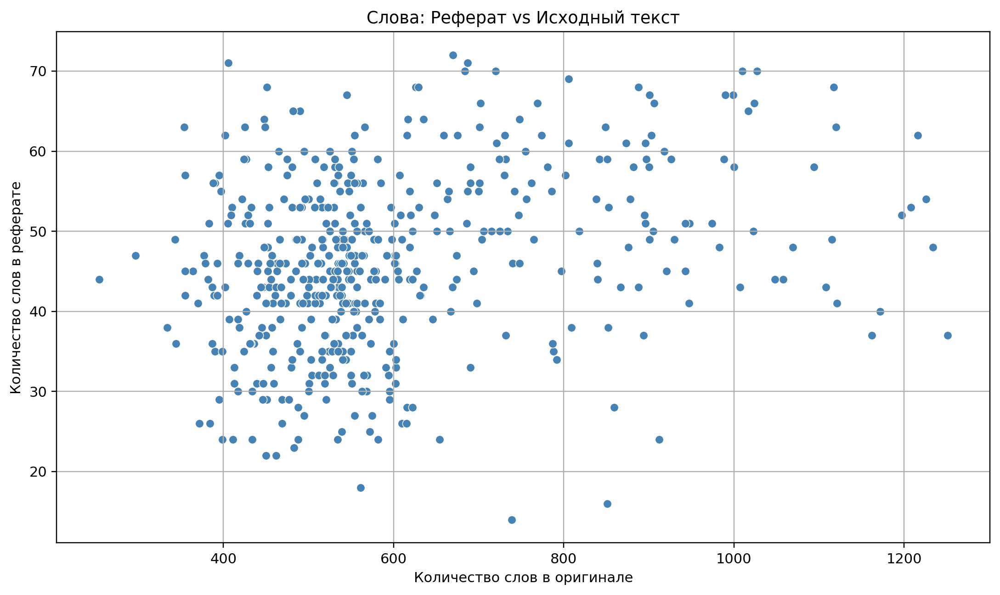

In [ ]:
plot_words_summary_vs_original_stats(texts, summary_texts)

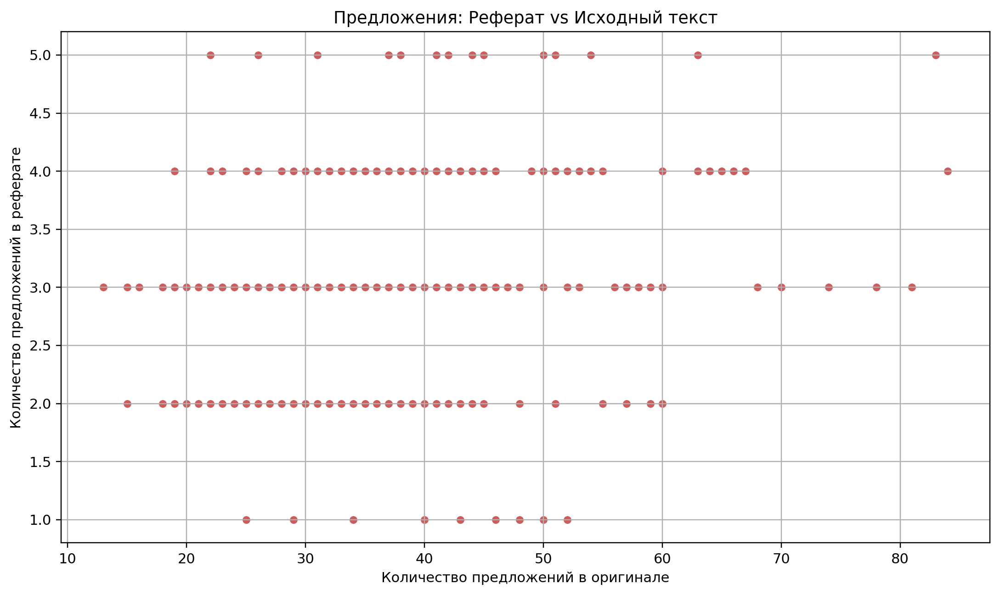

In [ ]:
plot_sentences_summary_vs_original_stats(texts, summary_texts)

# Анализ рефератов моделей

In [2]:
summaries_names = df.iloc[:, 1:].columns
summaries = [df[summary_col_name].dropna().values for summary_col_name in df.iloc[:, 1:]]
processed_summaries = [preprocess(summary) for summary in summaries]

## Кол-во слов/предложений

In [ ]:
def word_sent_distribution(texts, texts_orig, title='', summary=True):
    # --- Статистика ---
    word_counts = [len(text.split()) for text in texts]
    sentence_counts = [len(list(sentenize(text))) for text in texts]
    orig_word_counts = [len(text.split()) for text in texts_orig]
    orig_sentence_counts = [len(list(sentenize(text))) for text in texts_orig]

    # --- Цвета: контрастные и сочетающиеся ---
    colors = {
        "summary_words": '#2E8B57',    # sea green
        "orig_words": '#FFB347',       # pastel orange
        "summary_sent": '#DC143C',     # crimson
        "orig_sent": '#20B2AA'         # light sea green
    }
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 7))
    sns.set_style("whitegrid")

    # --- График 1: слова ---
    bins_words = np.linspace(10, 110, 31)
    sns.histplot(word_counts, bins=bins_words, kde=False, ax=axes[0],
                 color=colors['summary_words'], label='Рефераты модели',
                 edgecolor='black', alpha=0.85)
    sns.histplot(orig_word_counts, bins=bins_words, kde=False, ax=axes[0],
                 color=colors['orig_words'], label='Рефераты журналистов',
                 edgecolor='black', alpha=0.2, linewidth=1.5)
    axes[0].set_title('Распределение слов', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Кол-во слов', fontsize=12)
    axes[0].set_ylabel('Кол-во текстов', fontsize=12)
    axes[0].legend(loc='upper right', fontsize=10)
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(10))

    # --- График 2: предложения ---
    bins_sent = np.linspace(1, 8, 16)
    sns.histplot(sentence_counts, bins=bins_sent, kde=False, ax=axes[1],
                 color=colors['summary_sent'], label='Рефераты модели',
                 edgecolor='black', alpha=0.85)
    sns.histplot(orig_sentence_counts, bins=bins_sent, kde=False, ax=axes[1],
                 color=colors['orig_sent'], label='Рефераты журналистов',
                 edgecolor='black', alpha=0.4)
    axes[1].set_title('Распределение предложений', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Кол-во предложений', fontsize=12)
    axes[1].set_ylabel('Кол-во текстов', fontsize=12)
    axes[1].legend(loc='upper right', fontsize=10)
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(1))

    # --- Общий заголовок и отступы ---
    fig.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


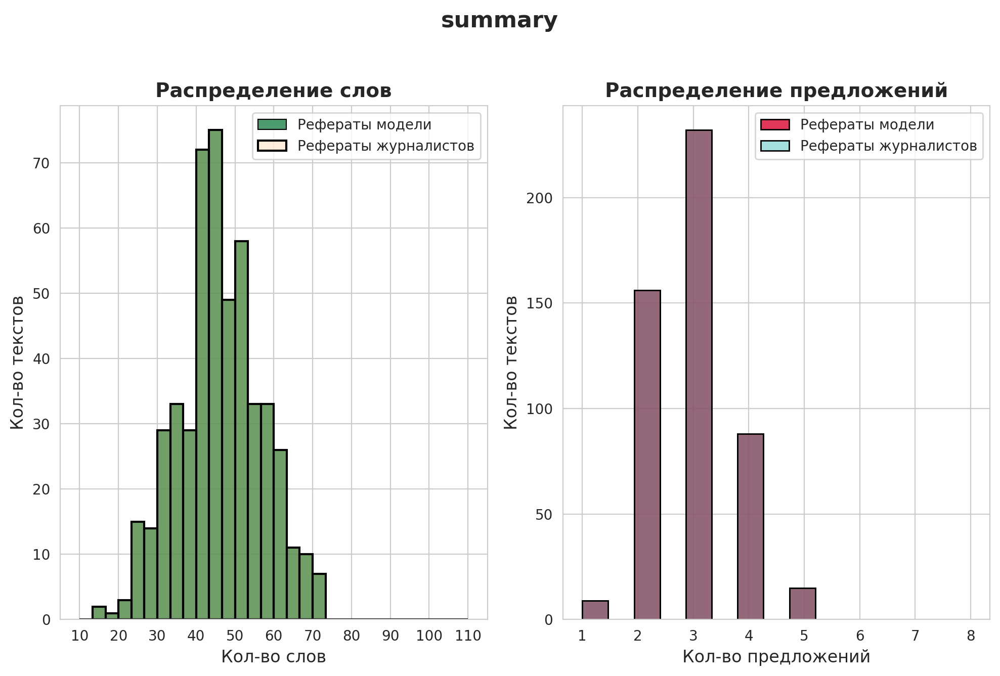

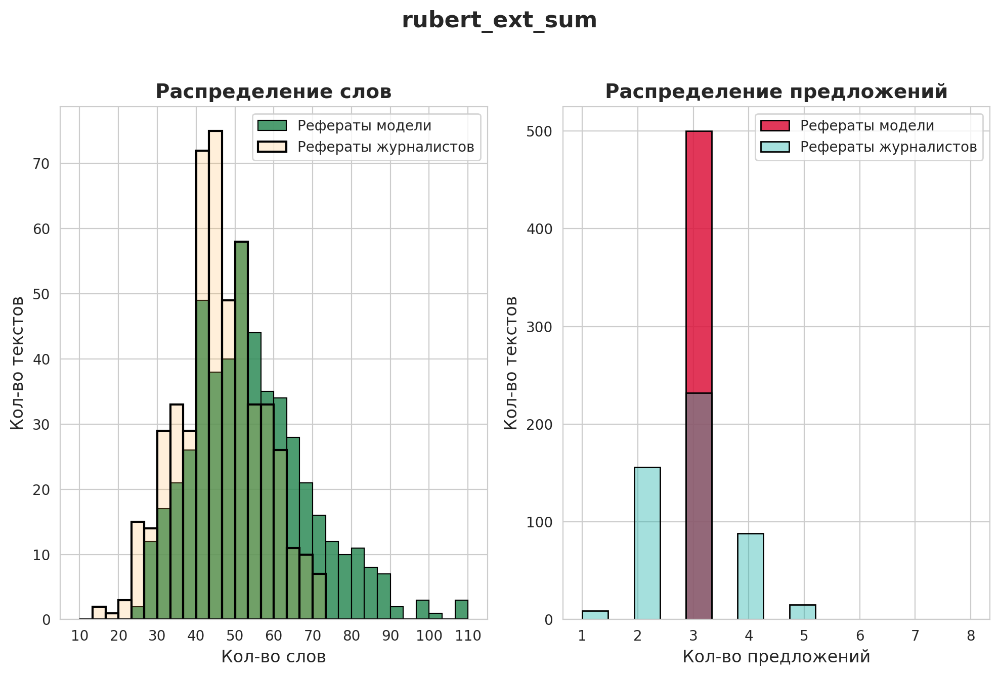

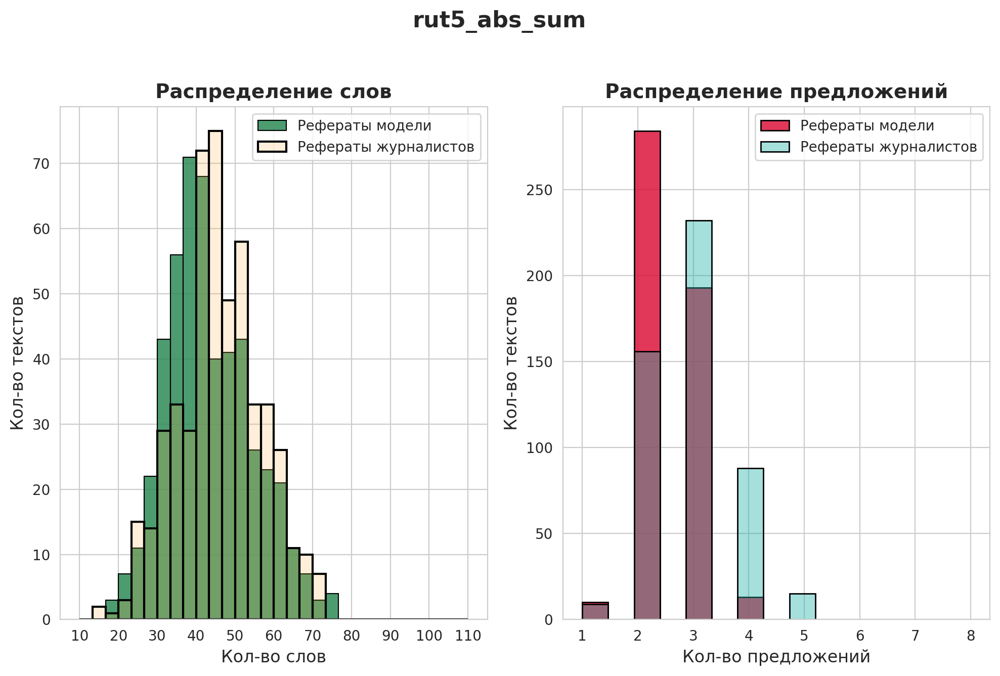

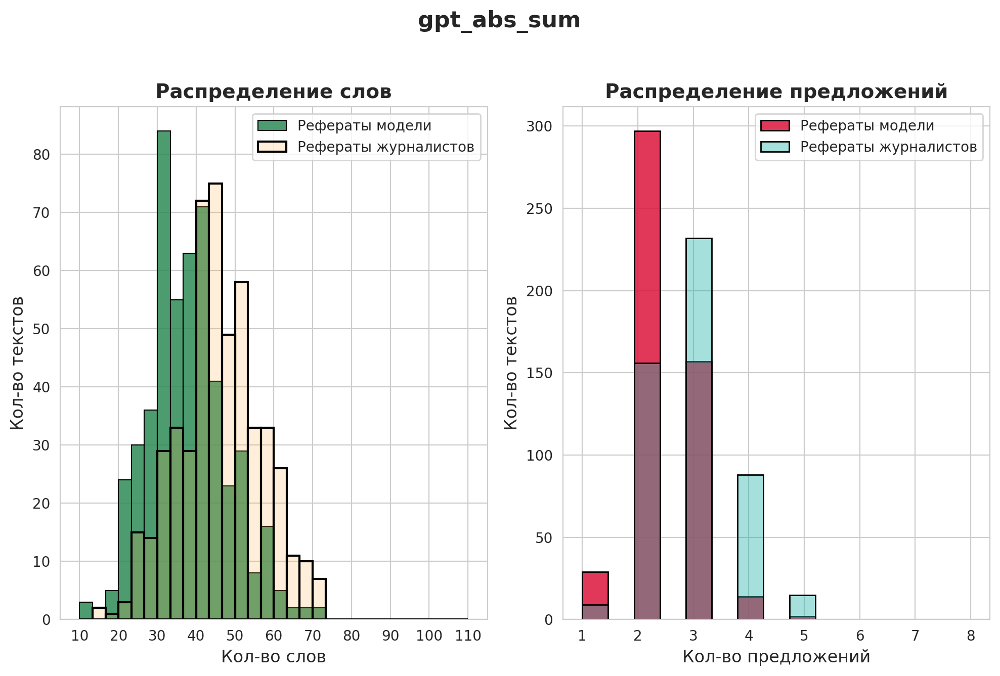

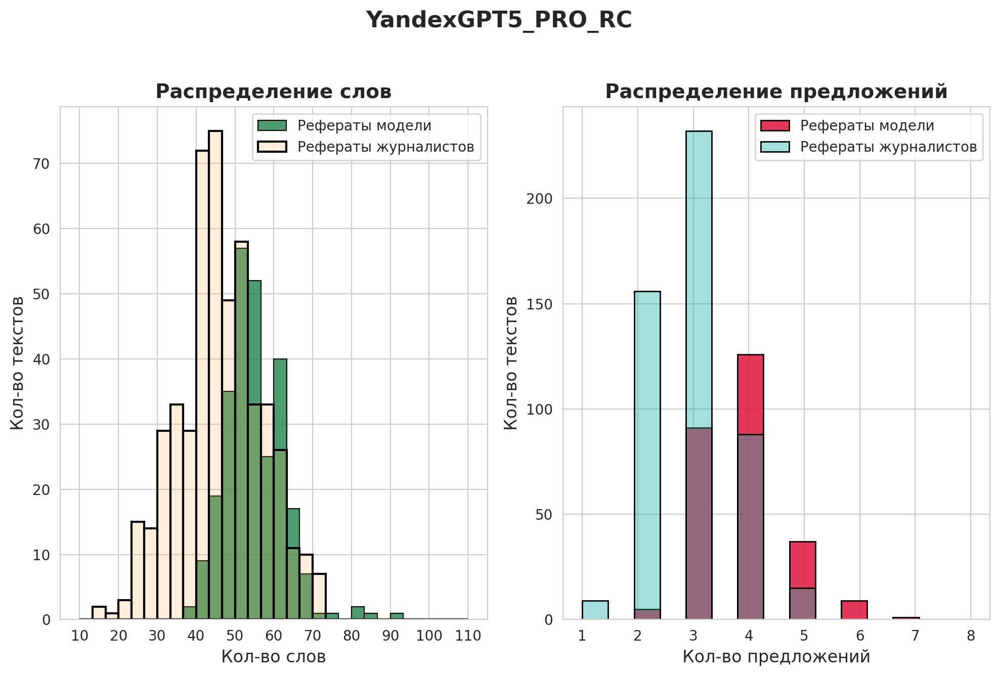

...

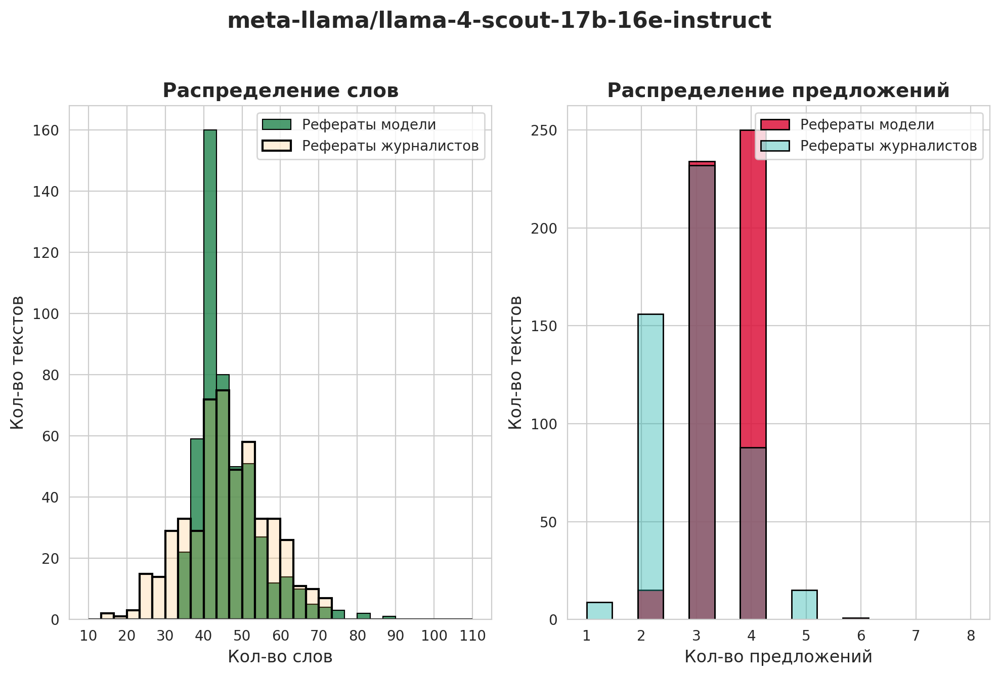

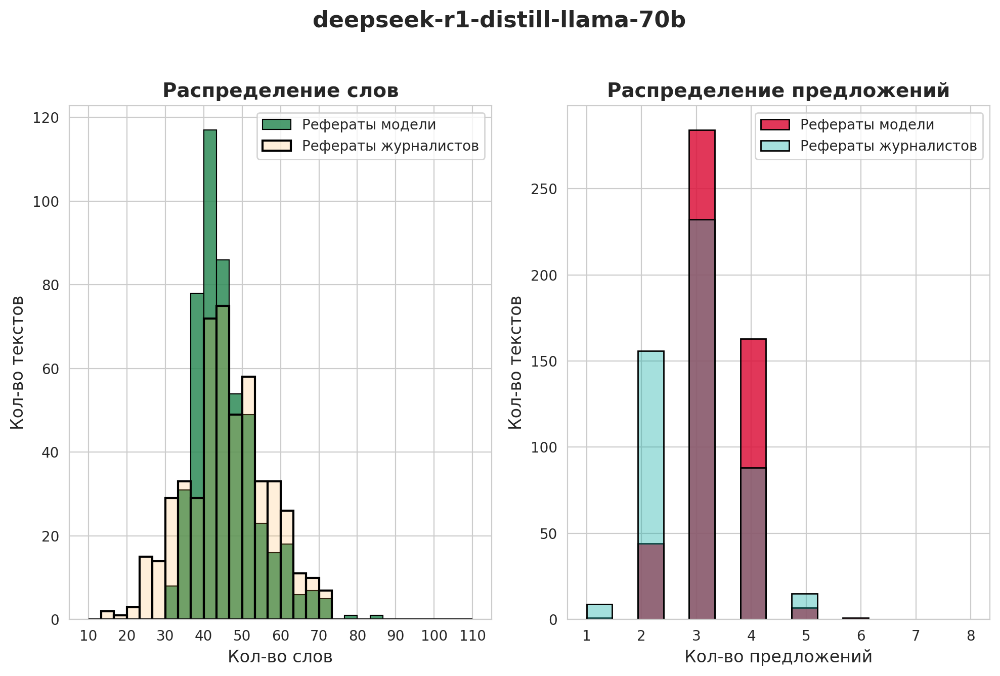

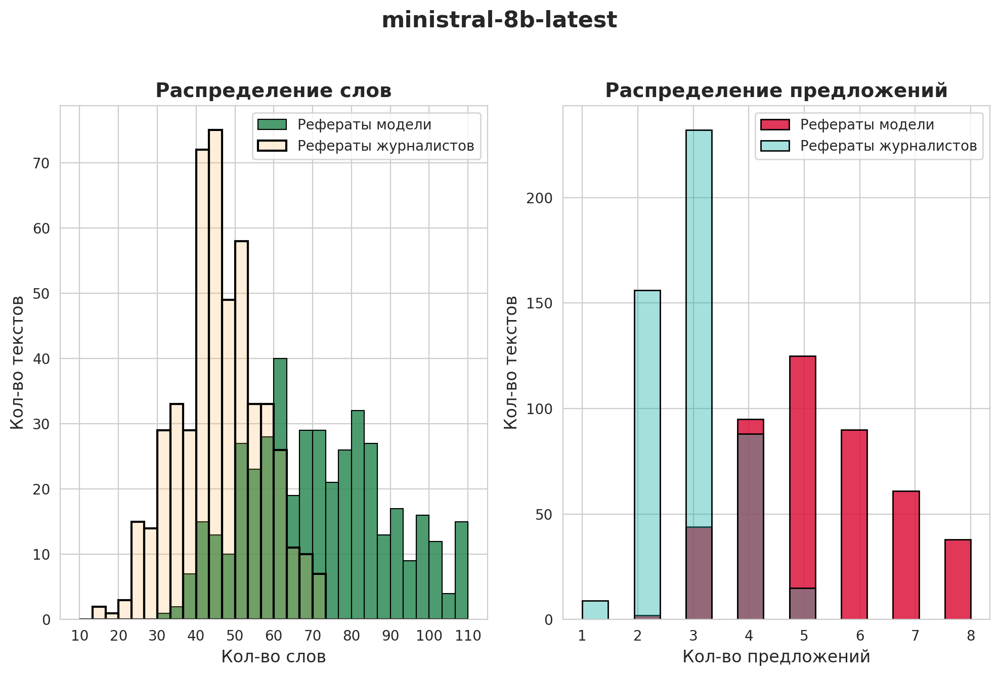

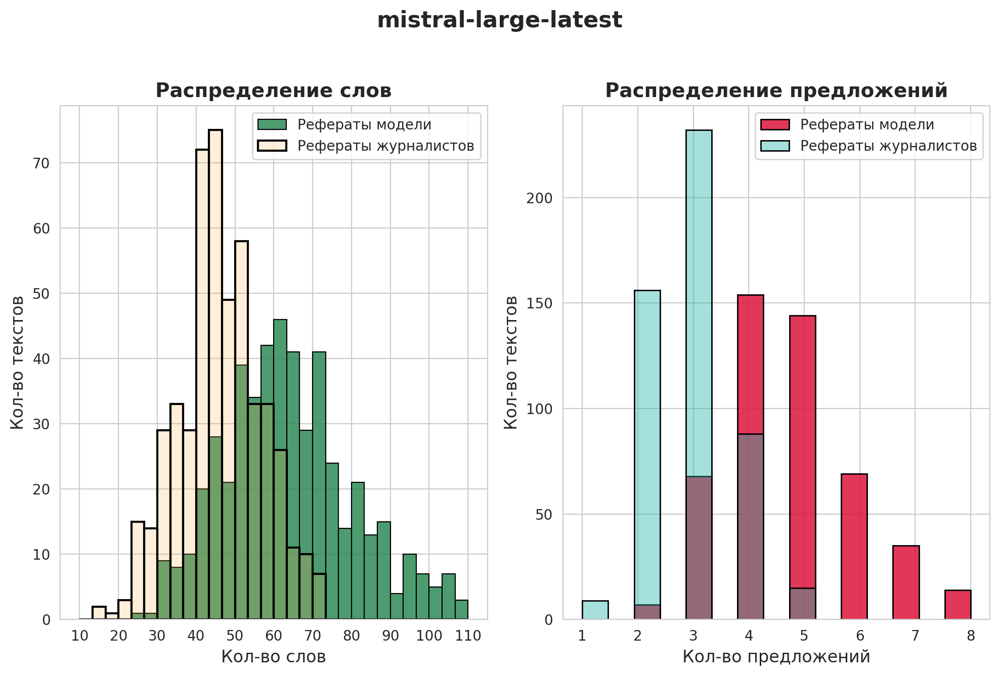

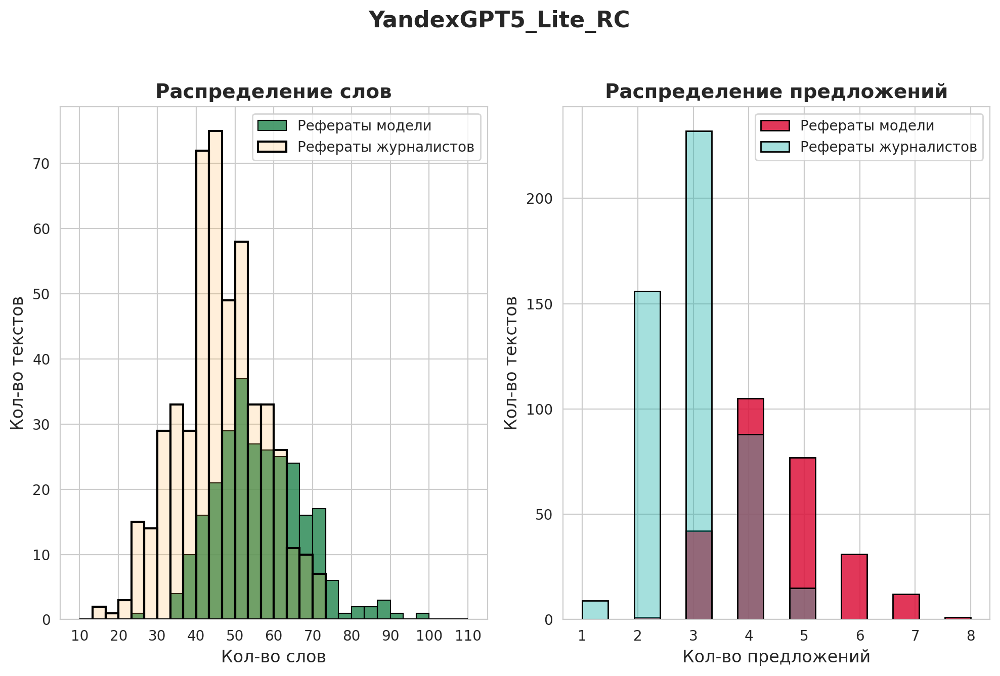

In [ ]:
for summary, name in zip(summaries, summaries_names):
    word_sent_distribution(summary, summary_texts,  title = f'{name}')

In [ ]:
df.shape

(500, 11)

## Облако слов

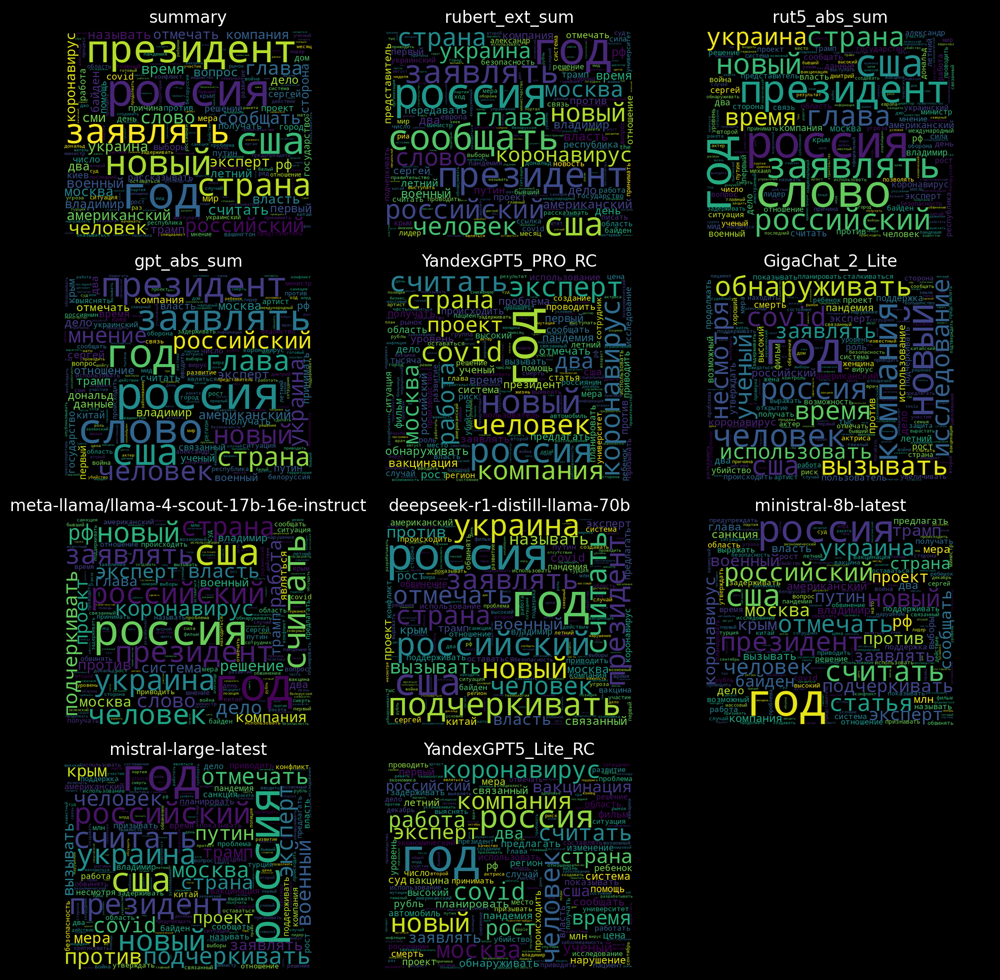

In [ ]:
plot_multiple_wordclouds(processed_summaries,n_cols = 3, n_rows = 4, titles = summaries_names, figsize = (10, 10))

#Анализ цензурированных текстов

In [ ]:
def plot_single_wordcloud(processed_texts, ax, title='Облако Лемм'):
    all_text = ' '.join(processed_texts)
    tokens = [word for word in all_text.split() if len(word) > 1]
    word_freq = Counter(tokens)
    wordcloud = WordCloud(width=600, height=500, background_color='black', max_font_size=100).generate_from_frequencies(word_freq)

    ax.imshow(wordcloud, interpolation='lanczos')
    ax.axis('off')
    ax.set_title(title)

In [ ]:
def plot_multiple_wordclouds(all_texts, n_cols, n_rows, figsize=(10, 4), titles=[]):
    # Применяем темный стиль только в данном контексте
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, dpi = 150)
        # Приведём axes к 1D для удобства обхода
        axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

        total_plots = n_cols * n_rows
        num_texts = len(all_texts)
        # Если облаков меньше чем subplot-ов, оставшиеся оси отключим
        for idx in range(total_plots):
            if idx < num_texts:
                plot_single_wordcloud(all_texts[idx], axes[idx], title=titles[idx])
            else:
                axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

## ГигаЧат

In [ ]:
giga = df['GigaChat_2_Lite']
texts_blocked_giga = df.text.loc[giga.isna()].values
processed_texts_blocked_giga = preprocess(texts_blocked_giga)

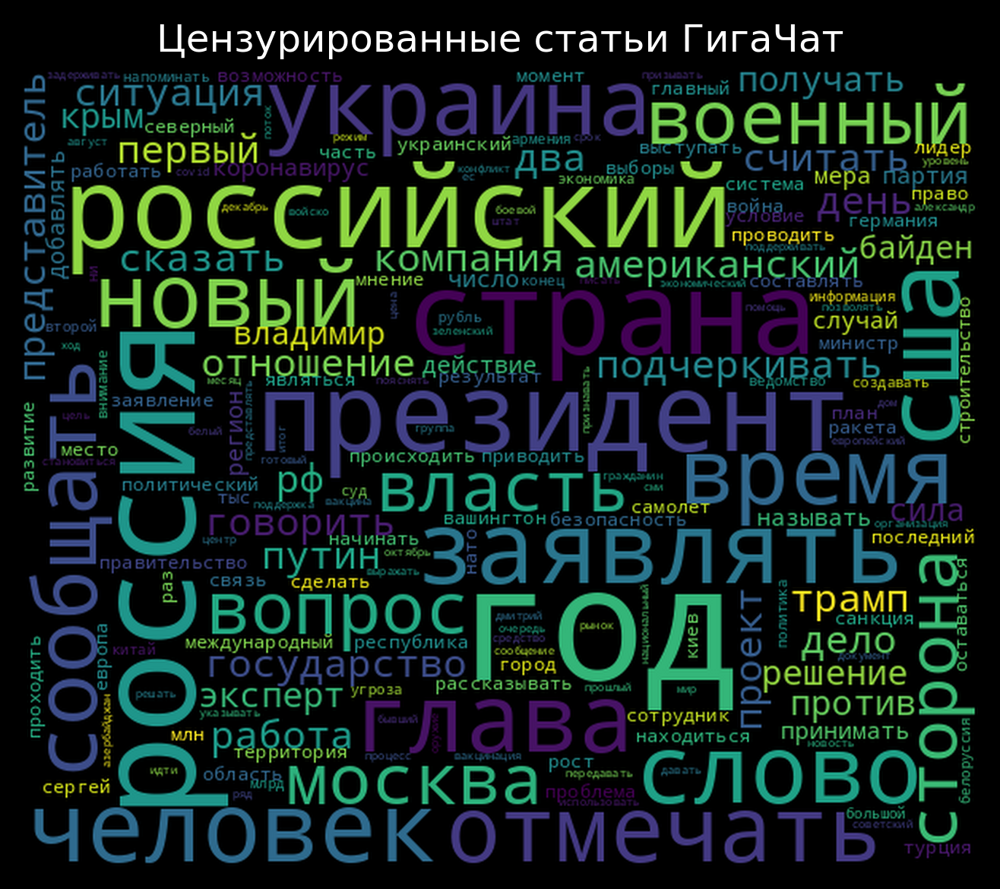

In [ ]:
plot_multiple_wordclouds([processed_texts_blocked_giga],n_cols = 1, n_rows = 1,
                         titles = ['Цензурированные статьи ГигаЧат'])

украина, военный, трамп, байден, крым, власть, американский, ракета, нато

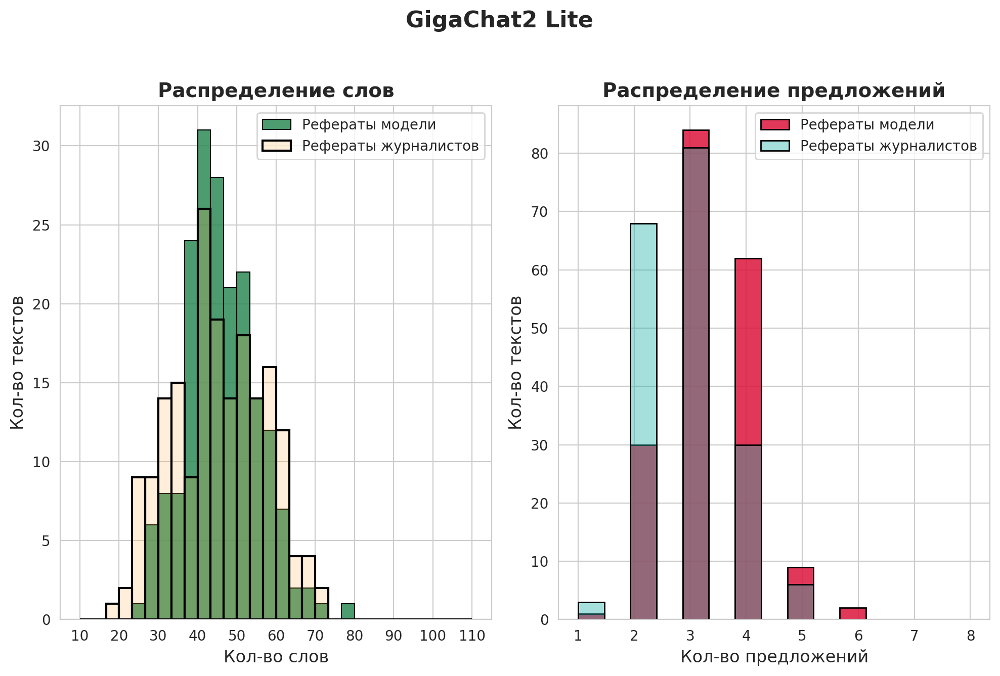

In [ ]:
word_sent_distribution(giga.values[giga.notna()], summary_texts[giga.notna()],  title = f'GigaChat2 Lite')

## Yandex GPT

In [ ]:
yandex = df['YandexGPT5_PRO_RC']
texts_blocked_yandex = df.text.loc[yandex.isna()].values
processed_texts_blocked_yandex = preprocess(texts_blocked_yandex)

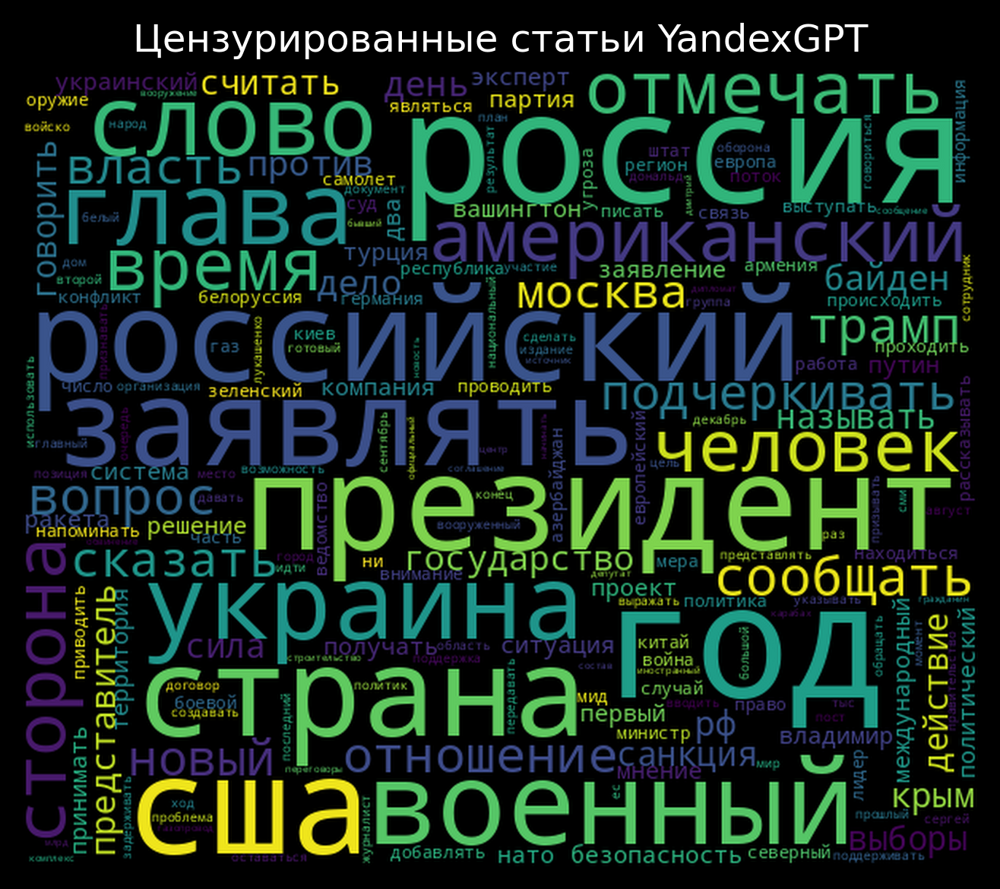

In [ ]:
plot_multiple_wordclouds([processed_texts_blocked_yandex],n_cols = 1, n_rows = 1,
                         titles = ['Цензурированные статьи YandexGPT'])

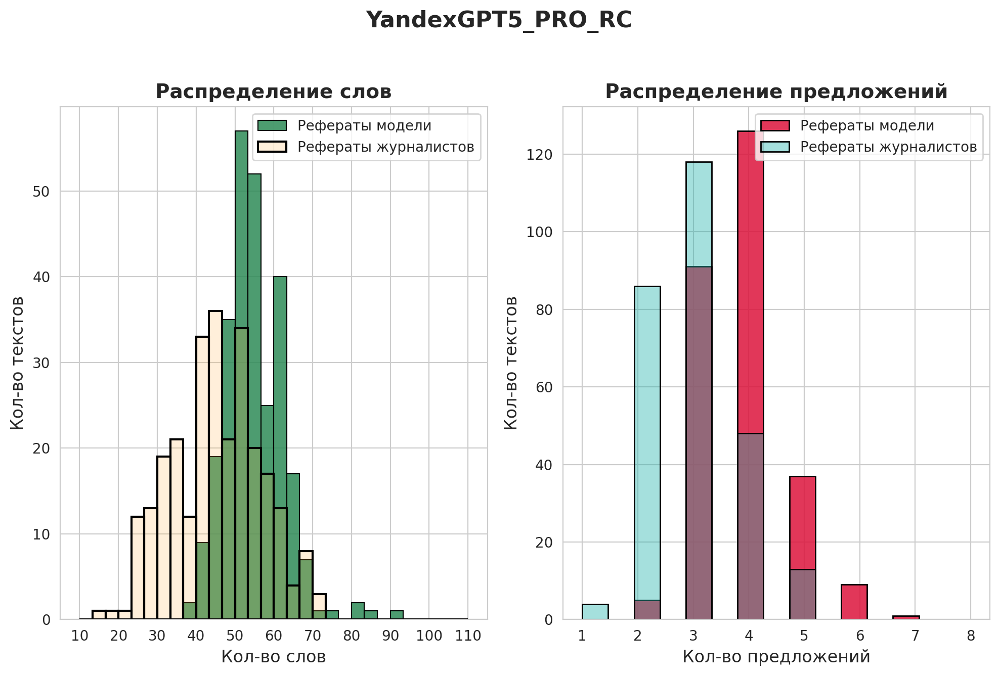

In [ ]:
word_sent_distribution(yandex.values[yandex.notna()], summary_texts[yandex.notna()],  title = f'YandexGPT5_PRO_RC')

In [ ]:
yandex = df['YandexGPT5_Lite_RC']
texts_blocked_yandex = df.text.loc[yandex.isna()].values

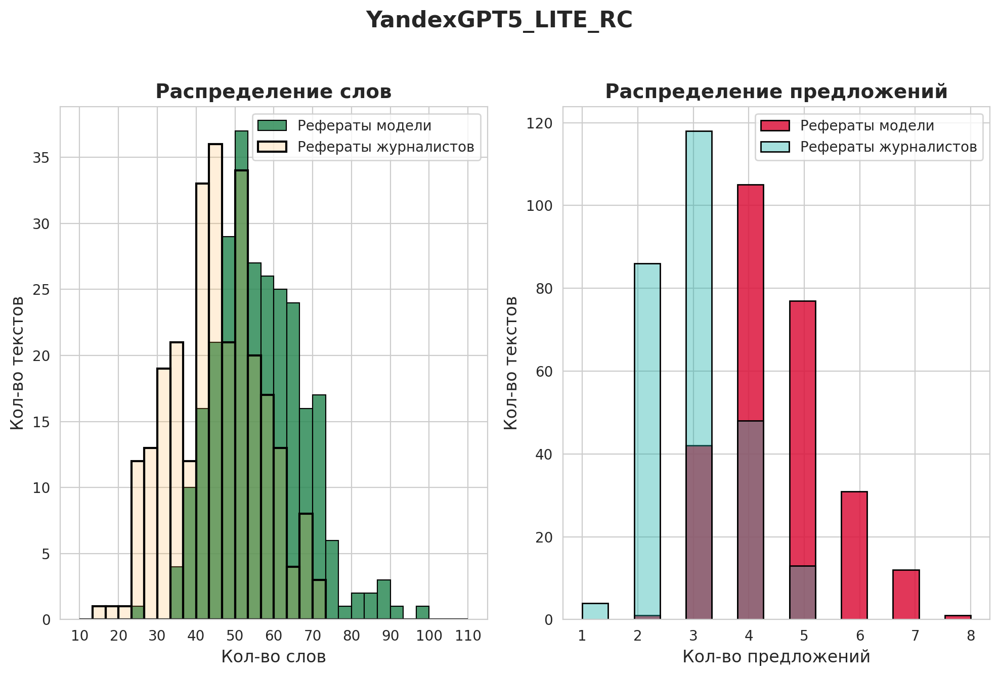

In [ ]:
word_sent_distribution(yandex.values[yandex.notna()], summary_texts[yandex.notna()],  title = f'YandexGPT5_LITE_RC')

# Метрики

In [ ]:
df.columns

Index(['text', 'summary', 'rubert_ext_sum', 'rut5_abs_sum', 'gpt_abs_sum',
       'YandexGPT5_PRO_RC', 'GigaChat_2_Lite',
       'meta-llama/llama-4-scout-17b-16e-instruct',
       'deepseek-r1-distill-llama-70b', 'ministral-8b-latest',
       'mistral-large-latest', 'YandexGPT5_Lite_RC'],
      dtype='object')

In [ ]:
candidate_columns = ['rubert_ext_sum', 'rut5_abs_sum', 'gpt_abs_sum',
       'meta-llama/llama-4-scout-17b-16e-instruct',
       'deepseek-r1-distill-llama-70b', 'ministral-8b-latest',
       'mistral-large-latest']

In [ ]:
reference_col = 'summary'
# candidate_columns = df.iloc[:, 2:].columns
references = df[reference_col].tolist()

rouge_metric = evaluate.load("rouge")
meteor_metric = evaluate.load("meteor")
bleu_metric = evaluate.load("bleu")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
results = {}

for candidate_col in tqdm(candidate_columns):
    predictions = df[candidate_col].tolist()

    # Compute ROUGE scores.
    # The computed 'rouge' result is a dict with keys like 'rouge1', 'rouge2', 'rougeL', etc.
    rouge_result = rouge_metric.compute(predictions=predictions, references=references)

    # Compute METEOR score.
    # The compute function returns a dictionary; here we extract the score under the key "meteor".
    meteor_result = meteor_metric.compute(predictions=predictions, references=references)
    meteor_score = meteor_result.get("meteor")

    # Compute BLEU score.
    # The BLEU metric returns a score (a float value) under the key "bleu".
    bleu_result = bleu_metric.compute(predictions=predictions, references=references)
    bleu_score = bleu_result.get("bleu")

    # Store the evaluation metrics.
    results[candidate_col] = {
        "rouge1": rouge_result.get("rouge1"),
        "rouge2": rouge_result.get("rouge2"),
        "rougeL": rouge_result.get("rougeL"),
        "meteor": meteor_score,
        "bleu": bleu_score
    }

  0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
results_df = pd.DataFrame.from_dict(results, orient="index")
results_df.index.name = "Summary Model"
results_df.reset_index(inplace=True)

In [ ]:
results_df.round(3)

,Summary Model,rouge1,rouge2,rougeL,meteor,bleu
0,rubert_ext_sum,0.228,0.075,0.221,0.267,0.083
1,rut5_abs_sum,0.214,0.059,0.210,0.245,0.090
2,gpt_abs_sum,0.163,0.022,0.158,0.183,0.037
3,meta-llama/llama-4-scout-17b-16e-instruct,0.265,0.076,0.255,0.239,0.075
4,deepseek-r1-distill-llama-70b,0.259,0.069,0.247,0.226,0.060
5,ministral-8b-latest,0.246,0.082,0.237,0.269,0.052
6,mistral-large-latest,0.266,0.083,0.256,0.248,0.051


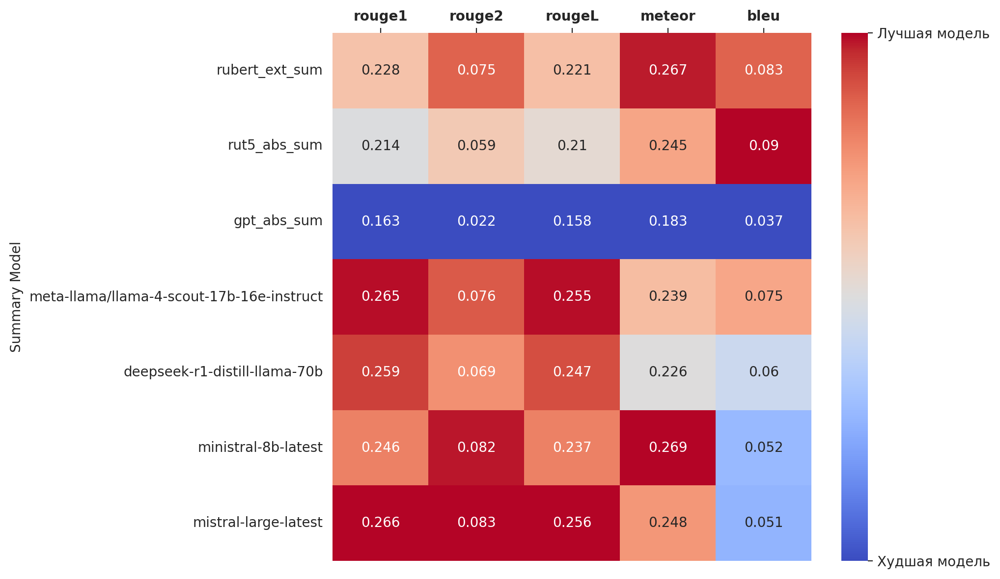

In [ ]:
df = pd.DataFrame(results_df.round(3))
df.set_index('Summary Model', inplace=True)

# --- min-max нормализация ---
df_norm = df.copy()
for col in df_norm.columns:
    min_val = df_norm[col].min()
    max_val = df_norm[col].max()
    df_norm[col] = (df_norm[col] - min_val) / (max_val - min_val)

# --- Построение heatmap ---
plt.figure(figsize=(10, 6))
ax = sns.heatmap(df_norm, annot=df, cmap='coolwarm', cbar=True, fmt='')

# Название графика
# plt.title("Результаты моделей")

# Настройка цветовой шкалы
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1])
cbar.set_ticklabels(['Худшая модель', 'Лучшая модель'])

# Сделать названия столбцов жирными
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.xaxis.set_ticks_position('top')

plt.tight_layout()
plt.show()

In [ ]:
df.head(2)

,text,summary,rubert_ext_sum,rut5_abs_sum,gpt_abs_sum,YandexGPT5_PRO_RC,GigaChat_2_Lite,meta-llama/llama-4-scout-17b-16e-instruct,deepseek-r1-distill-llama-70b,ministral-8b-latest,mistral-large-latest,YandexGPT5_Lite_RC
0,Американские вооруженные силы должны быть гото...,Экс-президент США продолжает критиковать админ...,Американские вооруженные силы должны быть гото...,"Бывший глава Белого дома Дональд Трамп заявил,...","Бывший президент США Дональд Трамп заявил, что...",NaN,NaN,"Дональд Трамп заявил, что американские вооруже...","Дональд Трамп заявил, что США должны быть гото...","Экс-президент США Дональд Трамп заявил, что ам...","Бывший президент США Дональд Трамп заявил, что...",NaN
1,"Международный коллектив ученых из Гарварда , П...",Международный коллектив под руководством гарва...,"Международный коллектив ученых из Гарварда , П...","Международный коллектив ученых из Гарварда, Пр...",Ученые из Гарварда и Принстона объявили о нача...,Международный коллектив учёных во главе с гарв...,Гарвардские ученые начали проект Galileo для п...,"Группа ученых из известных университетов, возг...",Международная команда ученых под руководством ...,"Международный коллектив ученых, включая Ави Лё...",Международная группа ученых под руководством А...,Международный коллектив учёных начал поиск док...


In [ ]:
names = df.columns[1:]
for text, name in zip(df.iloc[2].values[1:], names):
    print(name)
    print(text, '\n')


summary
Руководство Ford в очередной раз сделало выпад в сторону Tesla. На этот раз генеральный директор автопроизводителя заявил о том, компания Илона Маска заставляет покупателей самостоятельно «обкатывать» новую технологию автопилота, чего не позволяет себе Ford. По словам экспертов, конфликт между автопроизводителями связан с угрозами для классического автопрома, которые может принести Tesla. 

rubert_ext_sum
Генеральный директор Ford Джим Фарли обвиняет Tesla в использовании своих клиентов для тестирования недоработанных технологий, сообщает портал CNBC. Несмотря на свое название, система не может самостоятельно управлять электрокаром. Стоит отметить, что руководство Ford далеко не единожды делало выпады в сторону Tesla. 

rut5_abs_sum
Генеральный директор Ford Джим Фарли обвинил Tesla в использовании своих клиентов для тестирования недоработанных технологий. По его словам, компания Илона Маска выпустила бета-версию своего автопилота в октябре прошлого года, но отозвала доступ для